In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/hypertools/plot/__init__.py:10: UserWarning: Could not switch backend to TkAgg.  This may impact performance of the plotting functions.
  warnings.warn('Could not switch backend to TkAgg.  This may impact performance of the plotting functions.')


In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz')

In [6]:
dtfa = DTFA.DeepTFA([b for b in lepping_db.all() if 'response' not in b.task and 'tones' not in b.task],
                    mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz', num_factors=100, embedding_dim=2)

06/16/2019 18:31:51 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-music_run-3_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6)
06/16/2019 18:31:53 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-music_run-2_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6)
06/16/2019 18:31:55 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-nonmusic_run-4_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6)
06/16/2019 18:31:57 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/

In [7]:
dtfa.num_parameters()

1286212

In [8]:
dtfa.load_state('data/lepping_2017_noresponse_k100_n1000_06102019_232617')

In [9]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15)

(483365600.0, -481440768.0, 1924832.0)

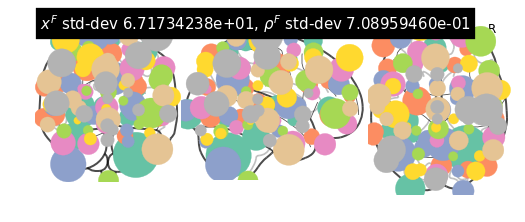

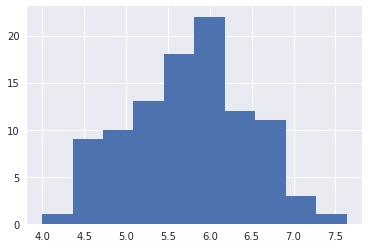

(<nilearn.plotting.displays.OrthoProjector at 0x7fa9ac027a58>,
 tensor([[-2.9271e+01, -1.0536e+02, -4.3538e+00],
         [ 4.5516e+01,  5.5060e+00, -1.0670e+01],
         [-3.6578e+00,  4.3136e+01,  1.9620e+00],
         [-2.7033e+01, -4.8044e+01,  4.3957e+01],
         [ 2.8958e+01, -6.2628e+01, -4.7744e+01],
         [ 4.0792e+01, -6.3411e+01,  6.1169e+01],
         [-3.5079e+01, -3.3728e+01, -2.8020e+01],
         [ 2.1704e+00,  2.6436e+01,  7.2874e+01],
         [-2.4650e+01, -1.1856e+01,  5.7313e+00],
         [ 3.1187e+01, -4.8350e+01,  2.1568e+01],
         [ 2.0861e+01, -6.4674e+01, -8.3417e+00],
         [ 3.9777e+01,  2.8139e+00,  5.4112e+01],
         [-5.2079e+01, -4.4602e+01,  7.1116e+01],
         [ 3.4007e+00, -8.0727e+01,  5.8868e+01],
         [-2.2344e+01, -1.2916e+01,  4.5181e+01],
         [-5.7654e+01,  4.5274e+01, -5.0536e+00],
         [ 2.9194e+01,  6.4904e+01,  1.3898e+01],
         [ 3.1399e+01, -8.5210e+01,  2.4241e+01],
         [ 2.9778e+01,  4.1446e+01,  

In [10]:
dtfa.visualize_factor_embedding()

In [11]:
def subject_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [12]:
def task_labeler(task):
    if task == 'negative_music':
        task = 'Negative music'
    elif task == 'positive_music':
        task = 'Positive music'
    elif task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = task.capitalize()
    return task

In [13]:
def lepping_2017_labeler(block):
    task = task_labeler(block.task)
    return task + ' stimulus'

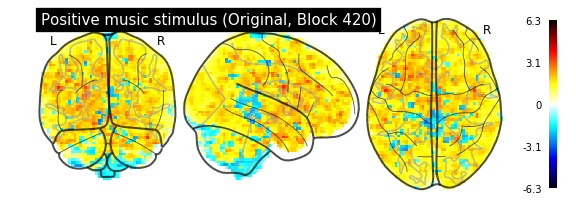

06/16/2019 18:37:56 Reconstruction Error (Frobenius Norm): 5.53615540e+02 out of 7.34962463e+02


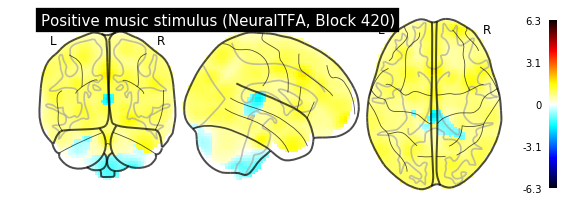

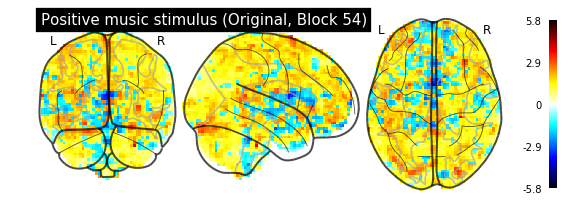

06/16/2019 18:37:59 Reconstruction Error (Frobenius Norm): 5.18895081e+02 out of 6.57971191e+02


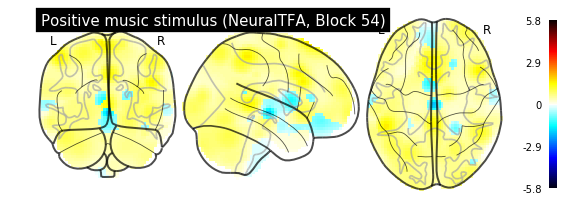

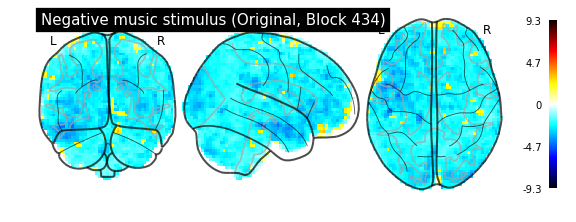

06/16/2019 18:38:02 Reconstruction Error (Frobenius Norm): 5.36369202e+02 out of 9.52191467e+02


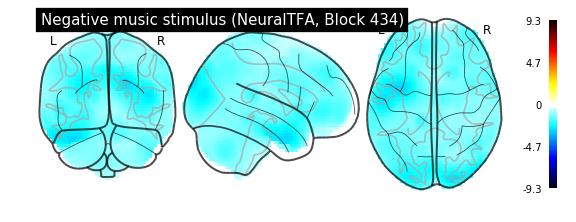

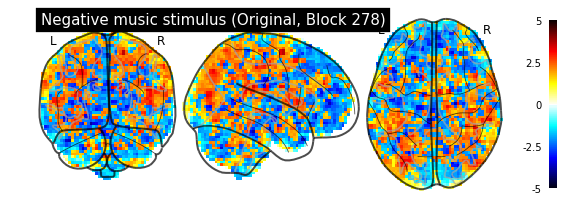

06/16/2019 18:38:05 Reconstruction Error (Frobenius Norm): 7.46560425e+02 out of 8.07936707e+02


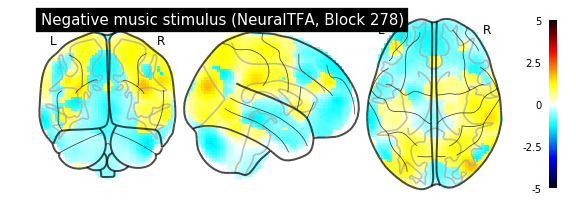

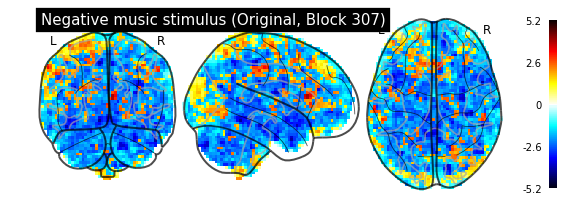

06/16/2019 18:38:08 Reconstruction Error (Frobenius Norm): 7.24871765e+02 out of 8.07835510e+02


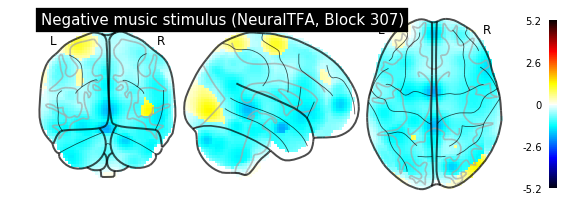

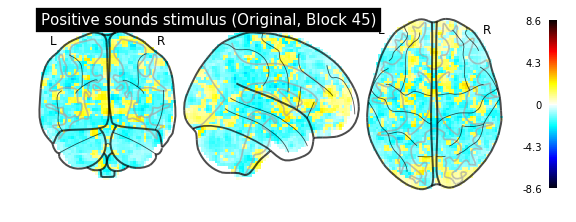

06/16/2019 18:38:11 Reconstruction Error (Frobenius Norm): 5.13968201e+02 out of 6.10942810e+02


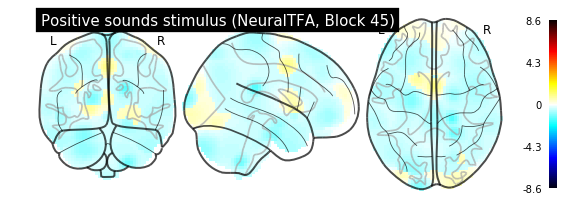

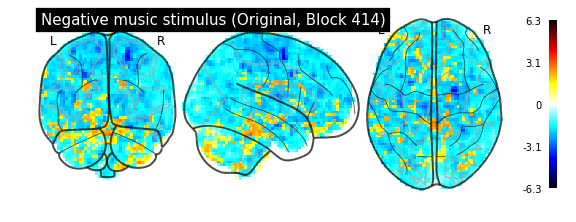

06/16/2019 18:38:14 Reconstruction Error (Frobenius Norm): 5.42685852e+02 out of 8.88662109e+02


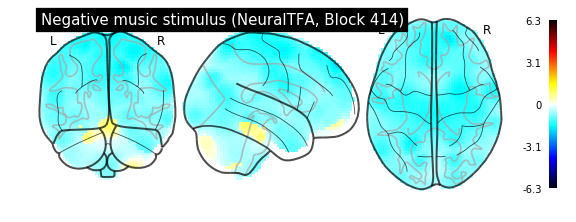

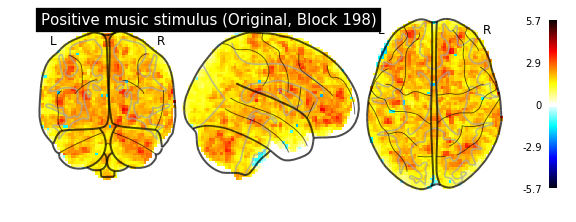

06/16/2019 18:38:17 Reconstruction Error (Frobenius Norm): 4.87772339e+02 out of 9.12881897e+02


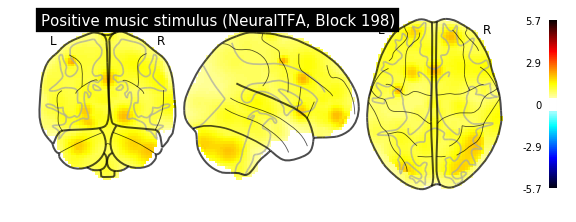

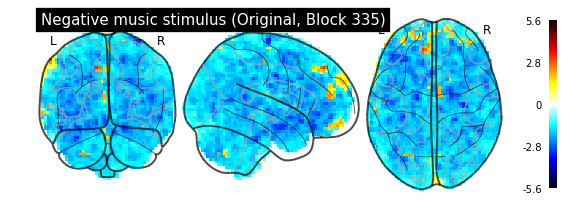

06/16/2019 18:38:20 Reconstruction Error (Frobenius Norm): 5.10152710e+02 out of 8.50309448e+02


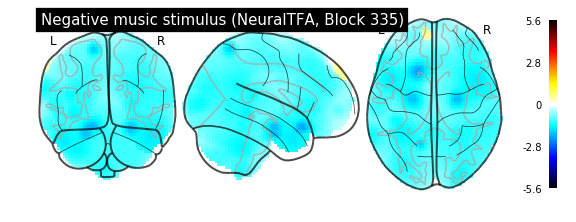

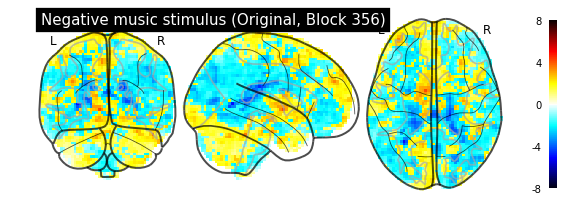

06/16/2019 18:38:23 Reconstruction Error (Frobenius Norm): 6.57652954e+02 out of 9.18203369e+02


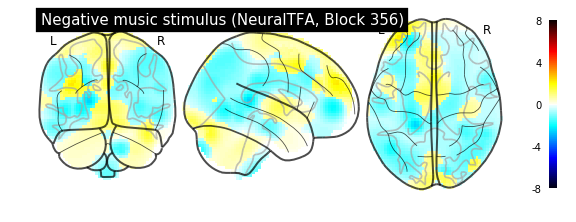

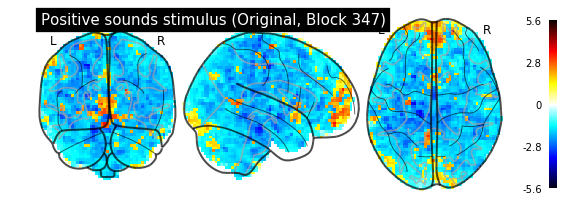

06/16/2019 18:38:26 Reconstruction Error (Frobenius Norm): 5.20416931e+02 out of 9.94147522e+02


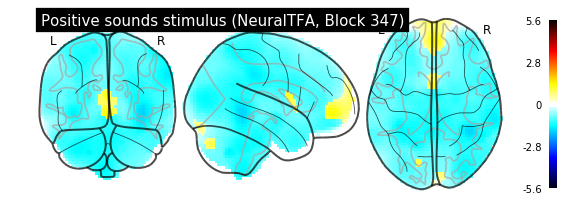

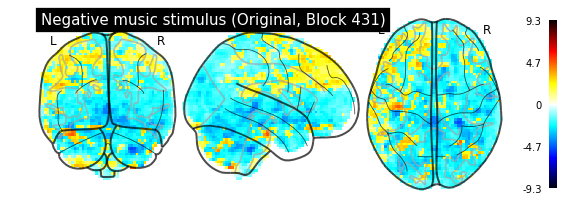

06/16/2019 18:38:29 Reconstruction Error (Frobenius Norm): 5.94718140e+02 out of 7.78717468e+02


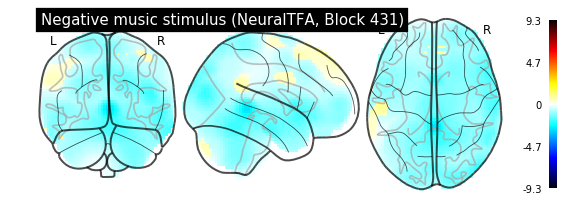

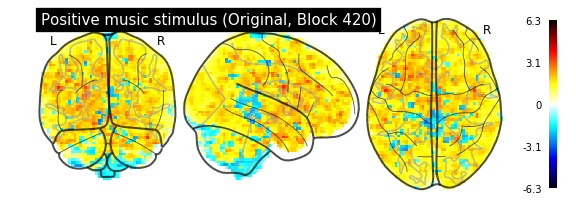

06/16/2019 18:38:33 Reconstruction Error (Frobenius Norm): 5.53615540e+02 out of 7.34962463e+02


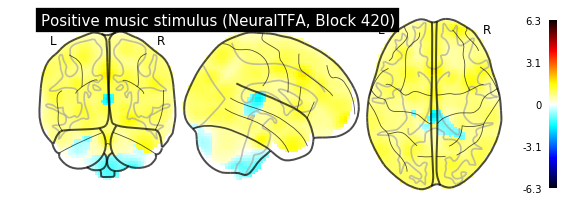

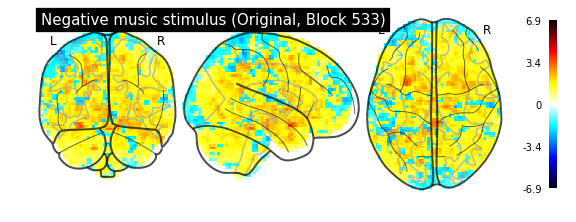

06/16/2019 18:38:36 Reconstruction Error (Frobenius Norm): 5.51030579e+02 out of 9.02016479e+02


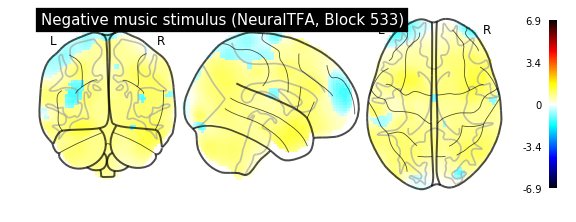

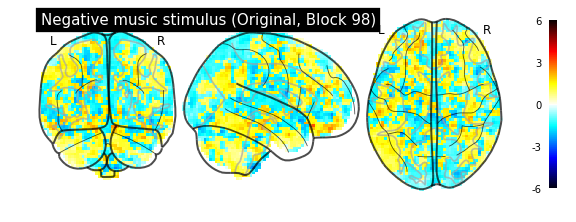

06/16/2019 18:38:39 Reconstruction Error (Frobenius Norm): 5.12155396e+02 out of 6.92595642e+02


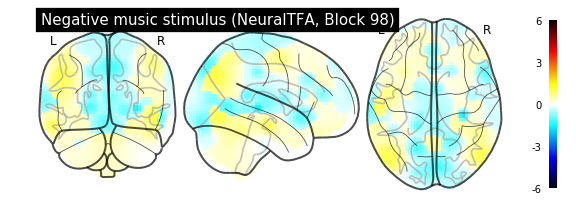

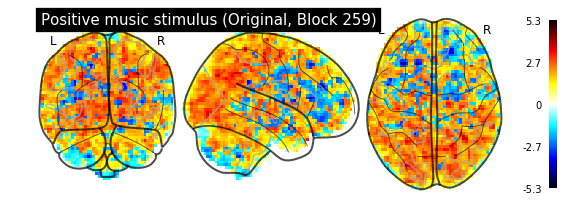

06/16/2019 18:38:42 Reconstruction Error (Frobenius Norm): 7.13467834e+02 out of 9.53640076e+02


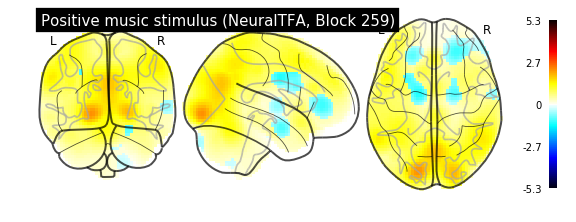

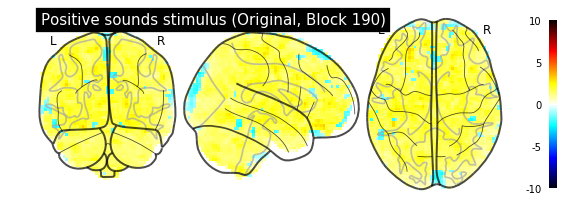

06/16/2019 18:38:45 Reconstruction Error (Frobenius Norm): 5.10127686e+02 out of 1.01832080e+03


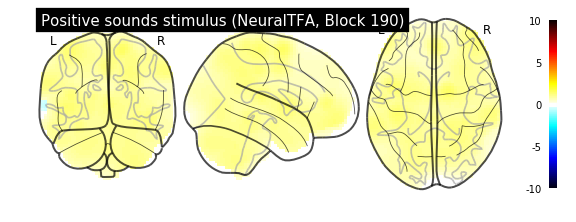

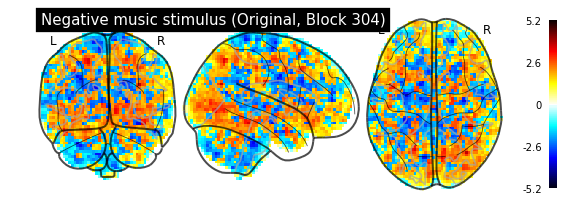

06/16/2019 18:38:48 Reconstruction Error (Frobenius Norm): 6.94307312e+02 out of 7.75100952e+02


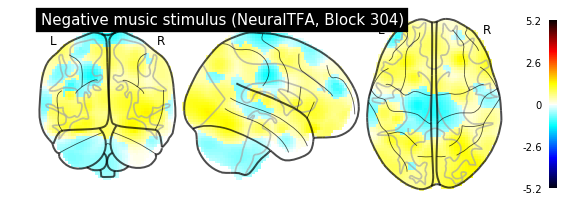

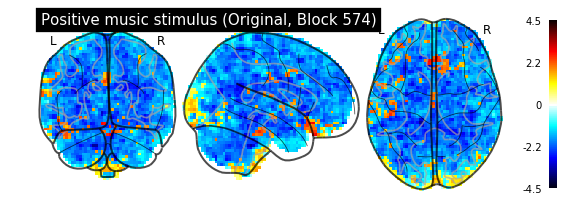

06/16/2019 18:38:51 Reconstruction Error (Frobenius Norm): 5.76454224e+02 out of 8.93066772e+02


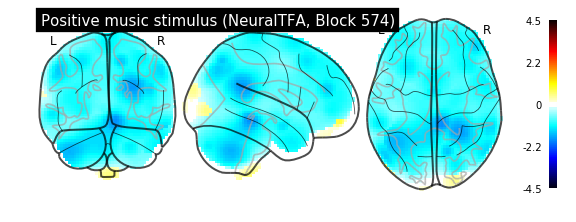

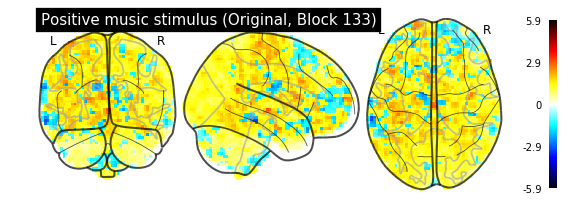

06/16/2019 18:38:54 Reconstruction Error (Frobenius Norm): 4.66721222e+02 out of 6.30119019e+02


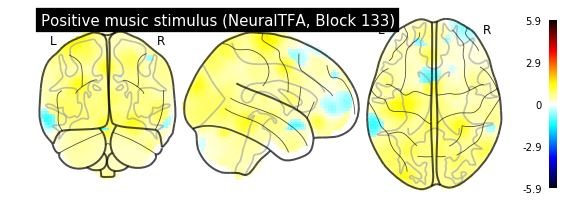

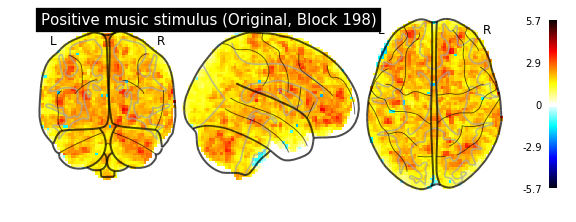

06/16/2019 18:38:57 Reconstruction Error (Frobenius Norm): 4.87772339e+02 out of 9.12881897e+02


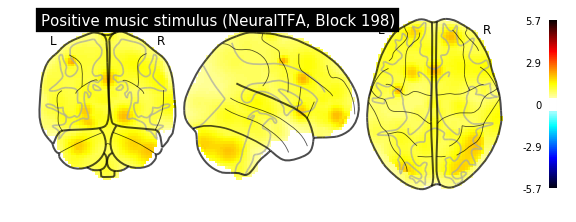

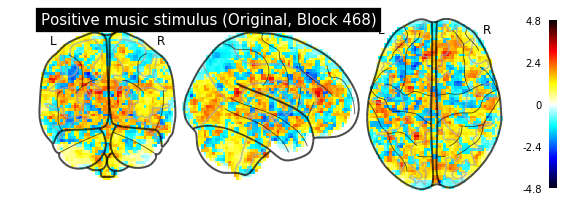

06/16/2019 18:39:00 Reconstruction Error (Frobenius Norm): 5.90440491e+02 out of 7.28785400e+02


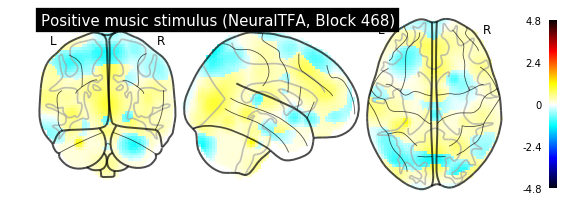

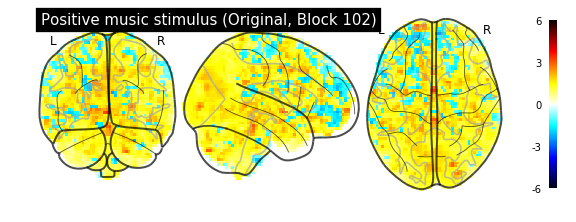

06/16/2019 18:39:03 Reconstruction Error (Frobenius Norm): 4.89832886e+02 out of 6.22655396e+02


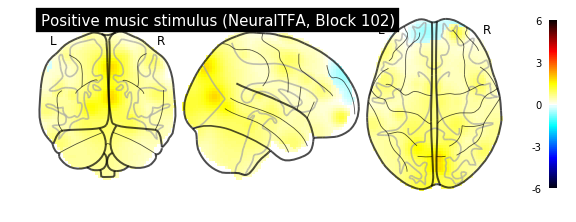

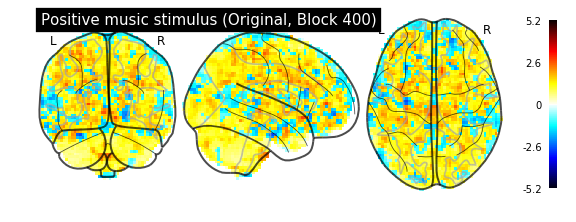

06/16/2019 18:39:06 Reconstruction Error (Frobenius Norm): 5.08250580e+02 out of 6.09423218e+02


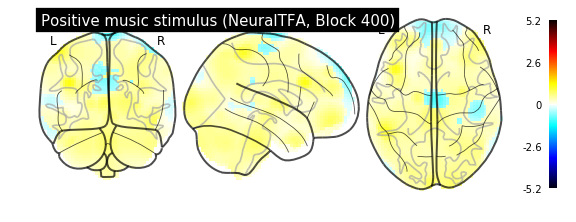

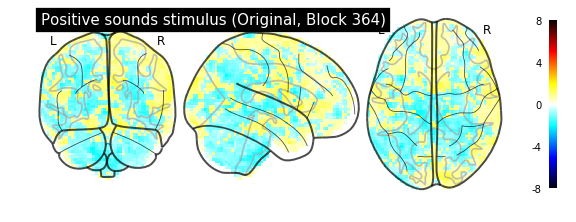

06/16/2019 18:39:09 Reconstruction Error (Frobenius Norm): 3.70529694e+02 out of 4.68487152e+02


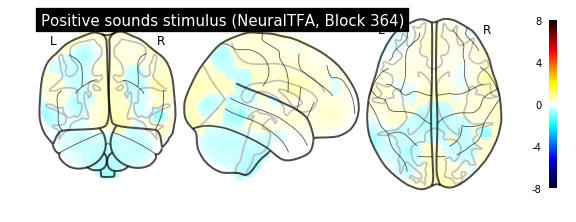

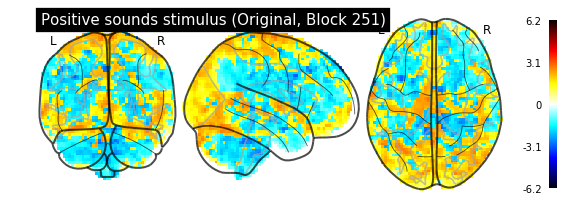

06/16/2019 18:39:12 Reconstruction Error (Frobenius Norm): 4.79444550e+02 out of 1.03185730e+03


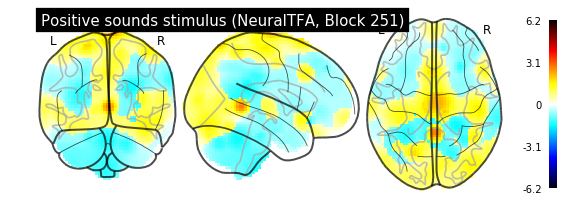

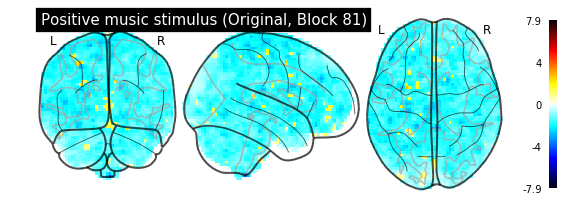

06/16/2019 18:39:15 Reconstruction Error (Frobenius Norm): 4.56665833e+02 out of 5.55938660e+02


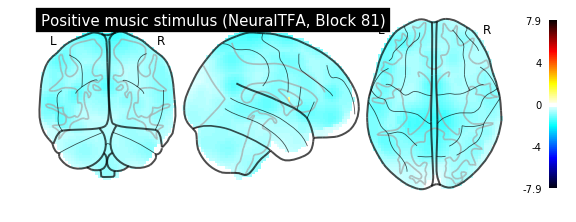

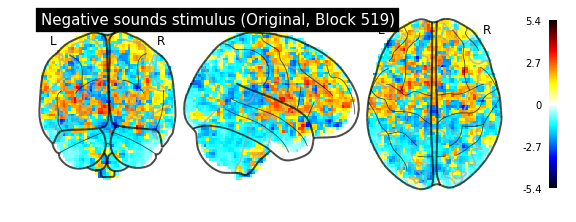

06/16/2019 18:39:18 Reconstruction Error (Frobenius Norm): 6.11613953e+02 out of 6.82306335e+02


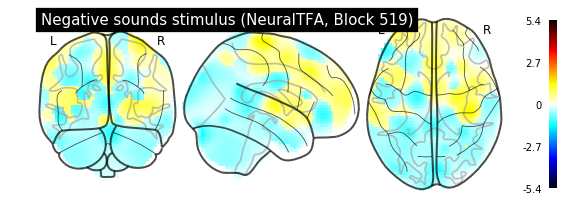

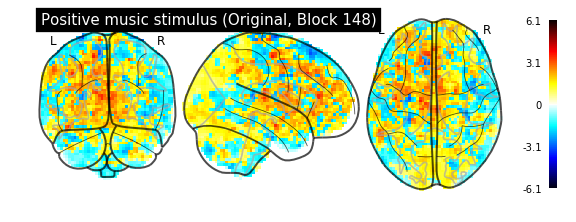

06/16/2019 18:39:21 Reconstruction Error (Frobenius Norm): 5.87356750e+02 out of 7.08371765e+02


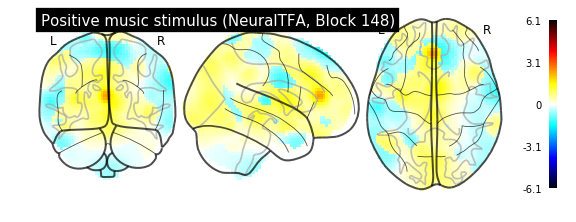

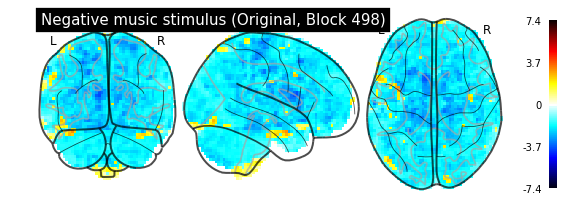

06/16/2019 18:39:24 Reconstruction Error (Frobenius Norm): 6.13566040e+02 out of 9.56410828e+02


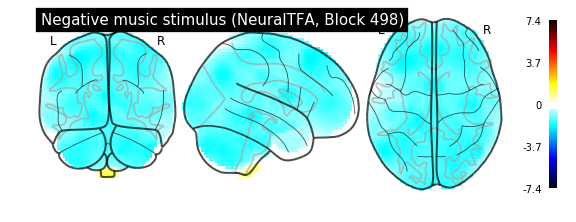

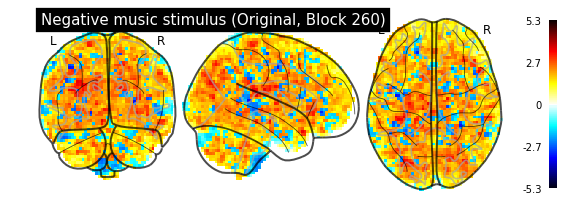

06/16/2019 18:39:27 Reconstruction Error (Frobenius Norm): 6.84367371e+02 out of 8.34571289e+02


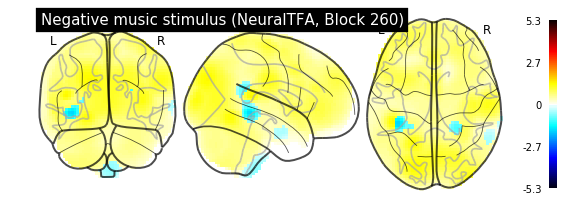

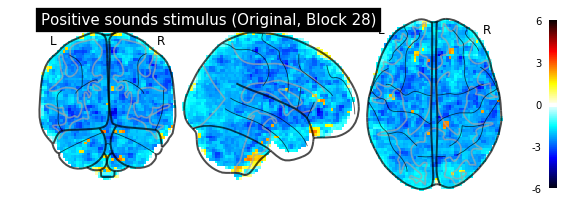

06/16/2019 18:39:30 Reconstruction Error (Frobenius Norm): 5.73183411e+02 out of 8.93965515e+02


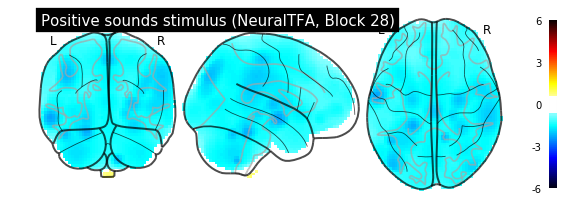

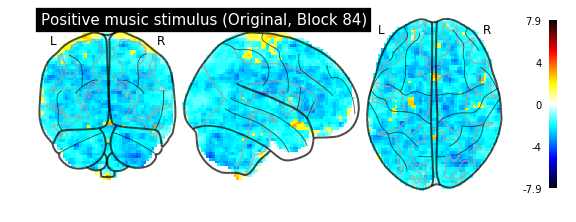

06/16/2019 18:39:33 Reconstruction Error (Frobenius Norm): 5.56751892e+02 out of 8.83896423e+02


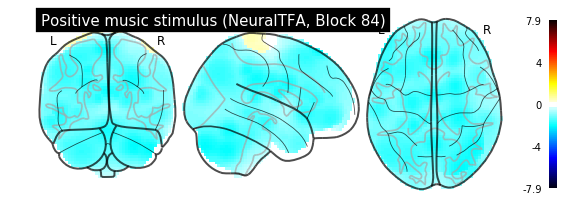

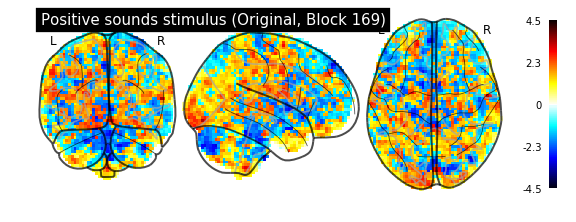

06/16/2019 18:39:36 Reconstruction Error (Frobenius Norm): 5.95569641e+02 out of 6.96649658e+02


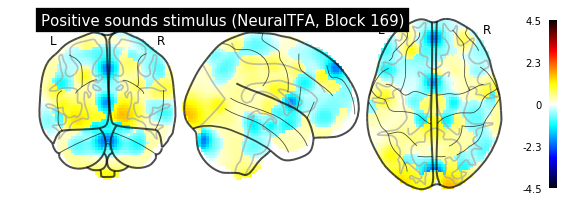

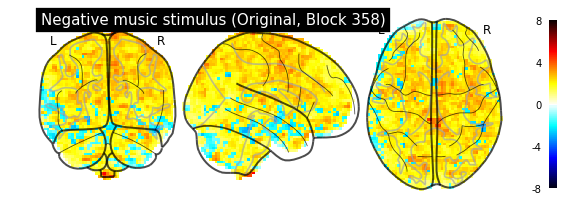

06/16/2019 18:39:39 Reconstruction Error (Frobenius Norm): 5.85694031e+02 out of 9.32194336e+02


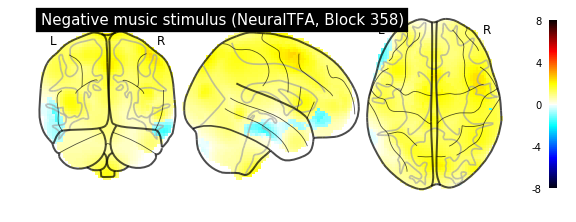

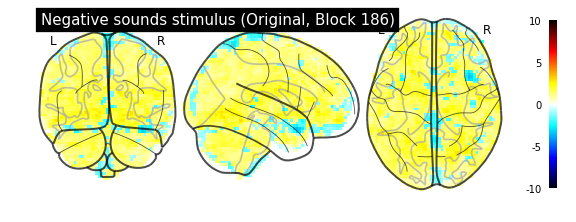

06/16/2019 18:39:42 Reconstruction Error (Frobenius Norm): 1.15448560e+03 out of 1.95493359e+03


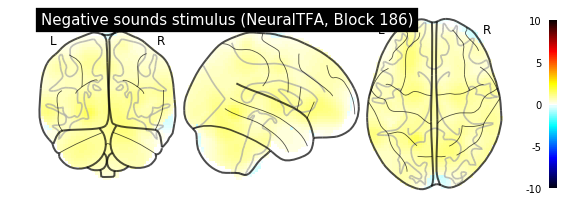

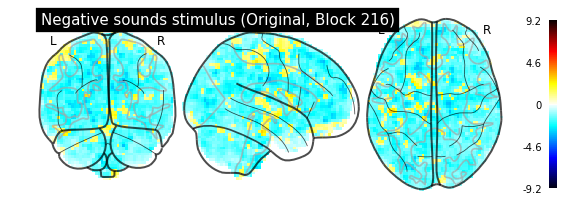

06/16/2019 18:39:45 Reconstruction Error (Frobenius Norm): 5.33335693e+02 out of 5.94204956e+02


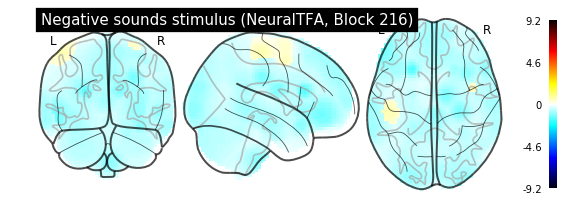

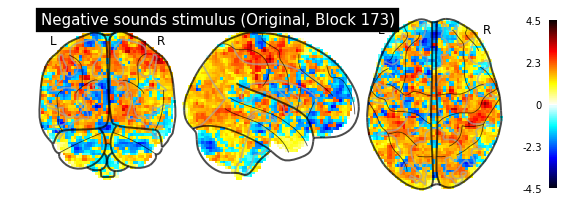

06/16/2019 18:39:48 Reconstruction Error (Frobenius Norm): 6.01338135e+02 out of 7.01942444e+02


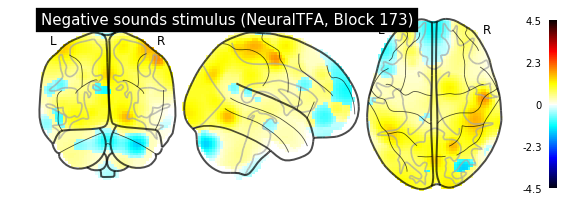

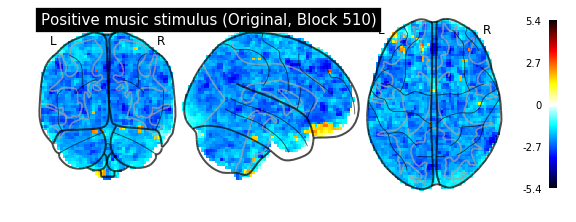

06/16/2019 18:39:51 Reconstruction Error (Frobenius Norm): 5.88928955e+02 out of 9.39342407e+02


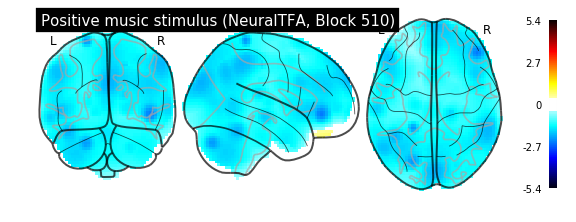

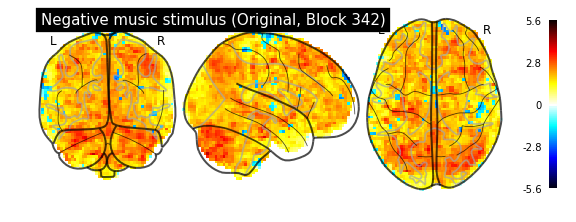

06/16/2019 18:39:54 Reconstruction Error (Frobenius Norm): 5.47967041e+02 out of 8.04470886e+02


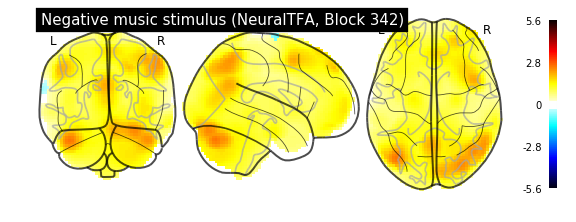

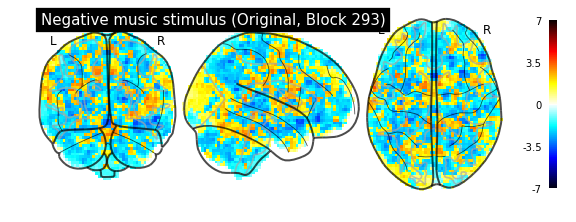

06/16/2019 18:39:57 Reconstruction Error (Frobenius Norm): 7.50752686e+02 out of 8.42823425e+02


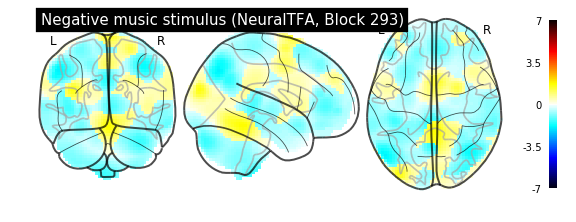

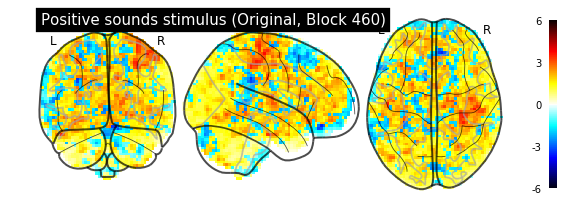

06/16/2019 18:40:01 Reconstruction Error (Frobenius Norm): 5.93146973e+02 out of 7.03024536e+02


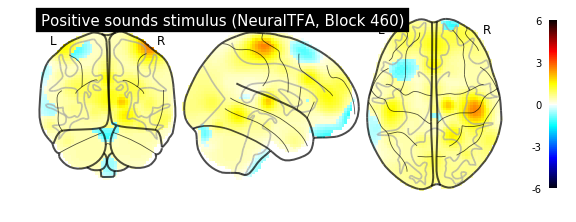

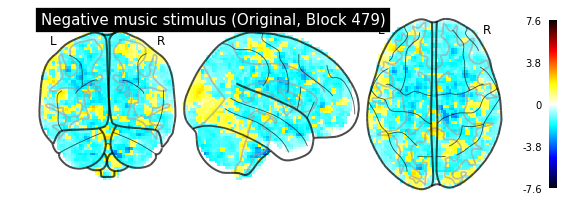

06/16/2019 18:40:04 Reconstruction Error (Frobenius Norm): 5.02705536e+02 out of 5.96997253e+02


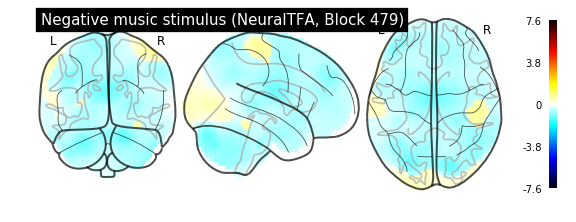

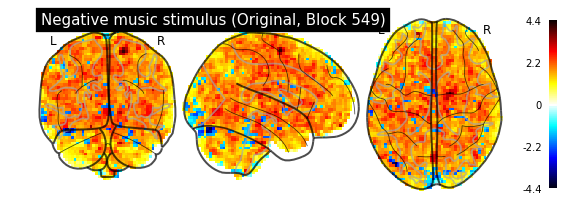

06/16/2019 18:40:07 Reconstruction Error (Frobenius Norm): 5.60685669e+02 out of 8.69381836e+02


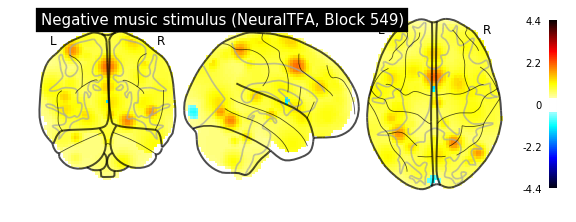

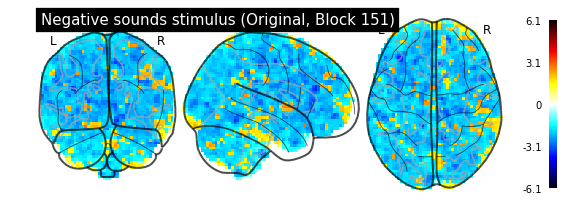

06/16/2019 18:40:10 Reconstruction Error (Frobenius Norm): 6.78052979e+02 out of 9.40790527e+02


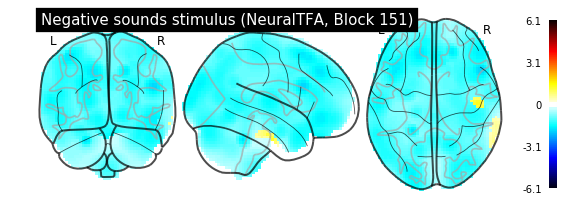

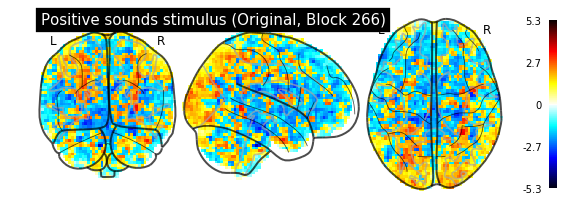

06/16/2019 18:40:13 Reconstruction Error (Frobenius Norm): 6.61973816e+02 out of 7.53623596e+02


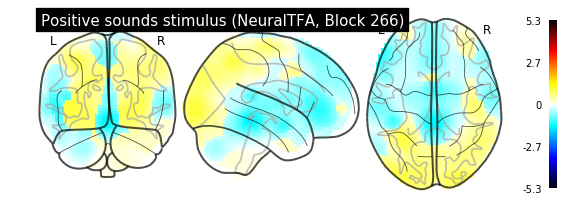

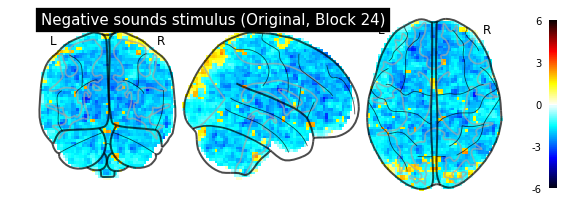

06/16/2019 18:40:16 Reconstruction Error (Frobenius Norm): 5.99647278e+02 out of 8.79572388e+02


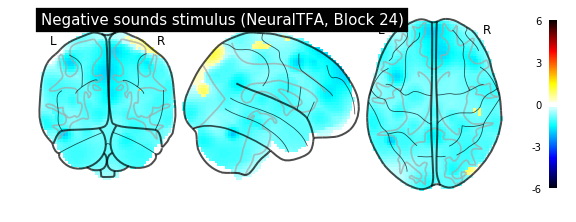

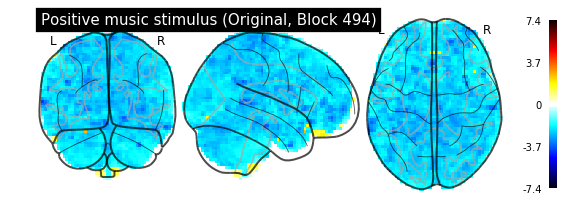

06/16/2019 18:40:19 Reconstruction Error (Frobenius Norm): 5.37499207e+02 out of 9.25015625e+02


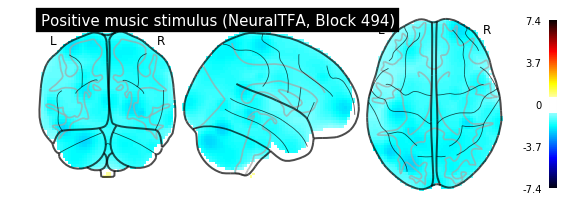

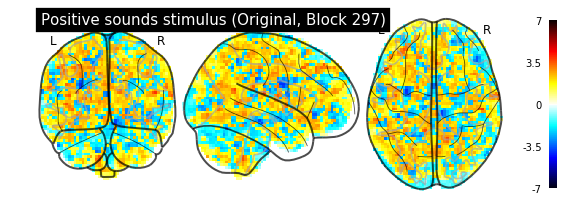

06/16/2019 18:40:22 Reconstruction Error (Frobenius Norm): 7.57478943e+02 out of 8.59460815e+02


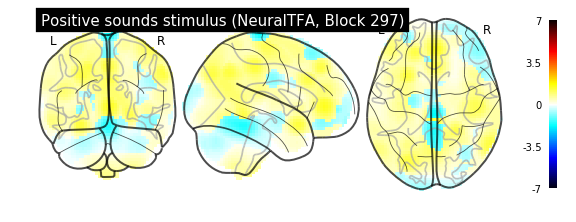

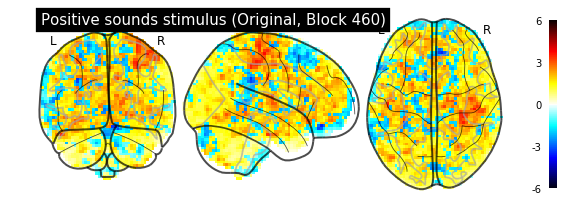

06/16/2019 18:40:25 Reconstruction Error (Frobenius Norm): 5.93146973e+02 out of 7.03024536e+02


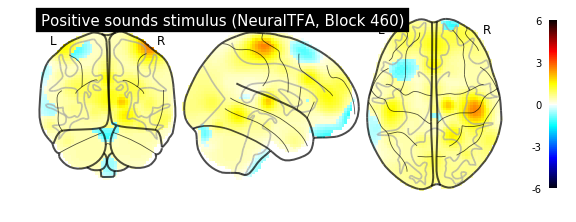

In [14]:
for b in np.random.choice(range(dtfa.num_blocks), 50):
    dtfa.plot_original_brain(b, labeler=lepping_2017_labeler)
    dtfa.plot_reconstruction(b, labeler=lepping_2017_labeler)

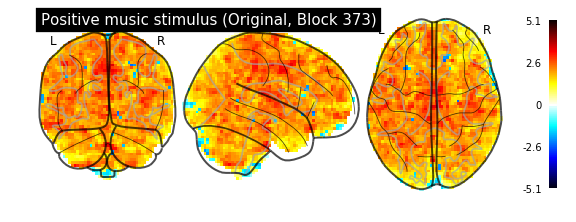

06/16/2019 18:40:28 Reconstruction Error (Frobenius Norm): 5.60676331e+02 out of 9.22131104e+02


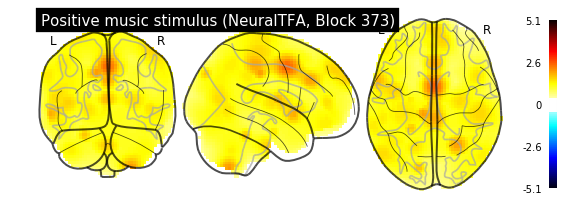

In [15]:
dtfa.plot_original_brain(319, labeler=lepping_2017_labeler)
dtfa.plot_reconstruction(319, labeler=lepping_2017_labeler)

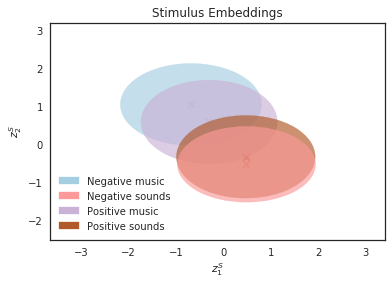

In [45]:
dtfa.scatter_task_embedding(labeler=task_labeler, figsize=None, colormap='Paired',
                            filename='lepping_2017_noresponse-task_embedding.pdf')

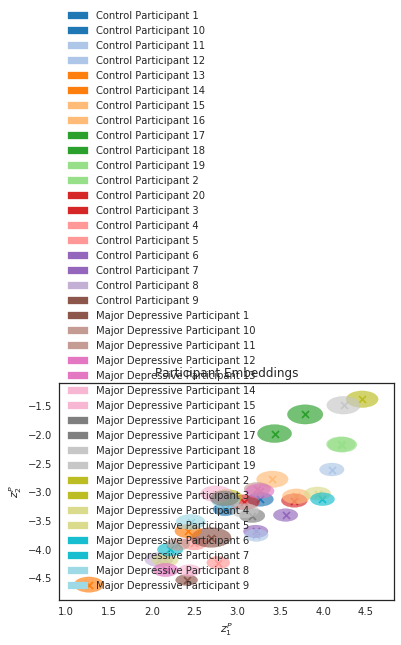

In [17]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None, colormap='tab20')

In [18]:
dtfa.average_reconstruction_error()

06/16/2019 18:41:00 Average reconstruction error (MSE): 6.65050444e-01
06/16/2019 18:41:00 Average data norm (Euclidean): 9.28131280e-01
06/16/2019 18:41:00 Percent average reconstruction error: 0.276287


(0.6650504440744505, 0.9281312803800874, 0.0027628728079919255)

In [19]:
dtfa.average_reconstruction_error(weighted=False)

06/16/2019 18:41:31 Average reconstruction error (MSE): 5.70859821e+02 +/- 8.68578769e+01
06/16/2019 18:41:31 Average data norm (Euclidean): 7.93378331e+02 +/- 1.40920715e+02
06/16/2019 18:41:31 Percent average reconstruction error: 73.337381 +/- 1.20559644e+01


(array([ 517.48876953,  522.87902832,  543.17663574,  534.25109863,
         636.51037598,  516.9463501 ,  532.84570312,  557.0234375 ,
         534.03015137,  527.46258545,  530.01123047,  533.21844482,
         517.24328613,  528.5446167 ,  545.51251221,  537.93438721,
         586.30316162,  578.11938477,  582.06182861,  588.87042236,
         604.2411499 ,  616.35675049,  589.46850586,  639.31628418,
         599.64727783,  582.5447998 ,  599.06707764,  643.79992676,
         573.18341064,  639.22991943,  582.45880127,  580.55310059,
         543.75585938,  502.99716187,  534.95184326,  557.51751709,
         485.60620117,  522.24591064,  532.6194458 ,  514.74304199,
         569.66558838,  557.70306396,  528.08099365,  545.36560059,
         551.49761963,  513.96820068,  616.55206299,  511.64837646,
         529.1763916 ,  518.07867432,  494.02093506,  513.82177734,
         516.26049805,  499.84899902,  518.89508057,  503.10110474,
         580.30883789,  533.99145508,  531.66882

In [20]:
def condition_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

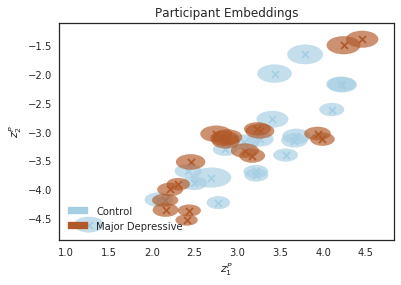

In [44]:
dtfa.scatter_subject_embedding(labeler=condition_labeler, figsize=None, colormap='Paired',
                               filename='lepping_2017_noresponse-subject_embedding.pdf')